<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
Import Libraries
</h1>

In [2]:
# for read and write in dataset structure

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import *
from scipy.io import loadmat
import os

# for fourier transform
from numpy.fft import fft, rfft
from scipy.fftpack import fft, ifft
from scipy.signal import butter, lfilter

# for time / frequency analysis
from scipy.constants import pi
from matplotlib import cm

# for topographic analysis : 
import mne
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits import mplot3d # need this for 3d plots
from mpl_toolkits.mplot3d import Axes3D

# Entropy Analysis : 
from scipy import stats
import matplotlib.gridspec as gridspec

<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
Import Datasets
</h1>

In [3]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# download dataset 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

github_username = 'darkrams98'
repo_name = 'Brain_Wave_Analysis_python'
file_name = 'sampleEEGdata.mat'
url = f'https://github.com/{github_username}/{repo_name}/raw/main/Project_Datasets/{file_name}'



# مسیر محل ذخیره فایل در سیستم
save_directory = 'Datasets'  # نام پوشه
save_path = os.path.join(save_directory, file_name)

# بررسی وجود پوشه و ایجاد آن اگر وجود نداشته باشد
if not os.path.exists(save_directory):
    os.makedirs(save_directory)

# بررسی وجود فایل
if not os.path.exists(save_path):
    # اگر فایل وجود نداشته باشد، دانلود کنید
    response = requests.get(url)
    with open(save_path, 'wb') as file:
        file.write(response.content)
    if response.status_code == 200:
        print('The download was successful !')
    else:
        print('An error occurred while downloading !', response.status_code)
else:
    print('The file already exists !')


The file already exists !


In [4]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# Load dataset :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

eeg_data = loadmat(save_path)


<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
Explore dataset structure
</h1>

In [21]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# # extract signals from python dict : 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

print(eeg_data.keys())
# print(eeg_data)

header = eeg_data["__header__"]
print(type(header))
print(header)
version_key = eeg_data["__version__"]
print(version_key)
globals_key = eeg_data["__globals__"]
print(globals_key)


# extract eeg main data :
EEG_main = eeg_data["EEG"][0 ,0]
EEG_data = eeg_data["EEG"][0, 0]["data"]
EEG_pnts = eeg_data["EEG"][0, 0]["pnts"][0, 0]  # number of points in EEG data
EEG_times = eeg_data["EEG"][0, 0]["times"][0]
EEG_srate = float(
    eeg_data["EEG"][0, 0]["srate"][0]
)  # make float for division purposes later
EEG_trials = eeg_data["EEG"][0, 0]["trials"][0, 0]
EEG_nbchan = eeg_data["EEG"][0, 0]["nbchan"][0, 0]
EEG_chanlocslabels = eeg_data["EEG"][0, 0]["chanlocs"][0]["labels"]
EEG_channel_loc_df = pd.DataFrame(eeg_data["EEG"][0, 0]["chanlocs"][0])
EEG_epoch = eeg_data["EEG"][0, 0]["epoch"][0]

# print data structure
print("eeg signals shape : \t", np.shape(EEG_data))
print("eeg segment trials : \t\t", EEG_pnts)
print("eeg sampling times : \t\t", np.shape(EEG_times))
print("eeg sampling rate : \t\t", EEG_srate)
print("eeg number of segments : \t", EEG_trials)
print("eeg number of channel : \t", EEG_nbchan)
print("eeg channels location : \t", np.shape(EEG_chanlocslabels))
print("eeg EEG_epoch : \t", np.shape(EEG_epoch))

print(EEG_channel_loc_df.shape)
channel_labels = []
for label in EEG_chanlocslabels:
    channel_labels.append(str(label))
print(channel_labels)
EEG_channel_loc_df.head()


dict_keys(['__header__', '__version__', '__globals__', 'EEG'])
<class 'bytes'>
b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Sat Dec  9 12:45:06 2023'
1.0
['EEG']
eeg signals shape : 	 (64, 640, 99)
eeg segment trials : 		 640
eeg sampling times : 		 (640,)
eeg sampling rate : 		 256.0
eeg number of segments : 	 99
eeg number of channel : 	 64
eeg channels location : 	 (64,)
eeg EEG_epoch : 	 (99,)
(64, 11)
["['Fp1']", "['AF7']", "['AF3']", "['F1']", "['F3']", "['F5']", "['F7']", "['FT7']", "['FC5']", "['FC3']", "['FC1']", "['C1']", "['C3']", "['C5']", "['T7']", "['TP7']", "['CP5']", "['CP3']", "['CP1']", "['P1']", "['P3']", "['P5']", "['P7']", "['P9']", "['PO7']", "['PO3']", "['O1']", "['Iz']", "['Oz']", "['POz']", "['Pz']", "['CPz']", "['Fpz']", "['Fp2']", "['AF8']", "['AF4']", "['AFz']", "['Fz']", "['F2']", "['F4']", "['F6']", "['F8']", "['FT8']", "['FC6']", "['FC4']", "['FC2']", "['FCz']", "['Cz']", "['C2']", "['C4']", "['C6']", "['T8']", "['TP8']", "['CP6']", "['CP4']", "[

/tmp/ipykernel_34605/96383505.py:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  EEG_srate = float(


,labels,theta,radius,X,Y,Z,sph_theta,sph_phi,sph_radius,type,urchan
0,[Fp1],[[-17.926000000000002]],[[0.5149888888888888]],[[80.78401376909139]],[[26.133014404070234]],[[-4.00108454195971]],[[17.926000000000002]],[[-2.6979999999999893]],[[85]],[],[[1]]
1,[AF7],[[-35.892]],[[0.5223333333333333]],[[68.69107635103231]],[[49.70943131488795]],[[-5.958898227616102]],[[35.892]],[[-4.019999999999997]],[[85]],[],[[2]]
2,[AF3],[[-22.461]],[[0.42112777777777777]],[[76.15276676848455]],[[31.48279679848069]],[[20.846813167733092]],[[22.461]],[[14.197000000000003]],[[85]],[],[[3]]
3,[F1],[[-23.492999999999995]],[[0.27902777777777776]],[[59.9127302448179]],[[26.042093389975367]],[[54.38082498895619]],[[23.492999999999995]],[[39.775000000000006]],[[85]],[],[[4]]
4,[F3],[[-39.947]],[[0.3445944444444444]],[[57.55106339309903]],[[48.200427317538846]],[[39.869711671018536]],[[39.947]],[[27.973000000000003]],[[85]],[],[[5]]


In [26]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# default parameters and function :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

sampling_freq = 256.0
seg_trials = 640  # number of sampling points in each segments
seg_num = 99  # number of segments
seg_time_list = np.arange(0, seg_trials) / sampling_freq
delta_t = seg_time_list[1] - seg_time_list[0]
sampling_freq_2 = 1 / delta_t
whole_time = seg_trials * delta_t

df = 1 / seg_time_list.max()  # Determine frequency resolution
fNQ = 1 / delta_t / 2  # Determine Nyquist frequency
faxis = np.arange(0, fNQ, df)  # Construct frequency axis
channel_labels = [
    "Fp1",
    "AF7",
    "AF3",
    "F1",
    "F3",
    "F5",
    "F7",
    "FT7",
    "FC5",
    "FC3",
    "FC1",
    "C1",
    "C3",
    "C5",
    "T7",
    "TP7",
    "CP5",
    "CP3",
    "CP1",
    "P1",
    "P3",
    "P5",
    "P7",
    "P9",
    "PO7",
    "PO3",
    "O1",
    "Iz",
    "Oz",
    "POz",
    "Pz",
    "CPz",
    "Fpz",
    "Fp2",
    "AF8",
    "AF4",
    "AFz",
    "Fz",
    "F2",
    "F4",
    "F6",
    "F8",
    "FT8",
    "FC6",
    "FC4",
    "FC2",
    "FCz",
    "Cz",
    "C2",
    "C4",
    "C6",
    "T8",
    "TP8",
    "CP6",
    "CP4",
    "CP2",
    "P2",
    "P4",
    "P6",
    "P8",
    "P10",
    "PO8",
    "PO4",
    "O2",
]


# print(seg_time_list)
print(len(seg_time_list))
print("sampling time not rounded : ", delta_t)
print("sampling time rounded : ", round(delta_t * 10**3), " ms ")
print("sampling_freq_2 = ", sampling_freq_2)
print("sampling direction (second) : ", np.max(seg_time_list))

# reshape data set to (channels, segments_number , number_of_trials)
eeg_signal = EEG_data.reshape(
    np.shape(EEG_data)[0], np.shape(EEG_data)[2], np.shape(EEG_data)[1]
)
print(np.shape(eeg_signal))

# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot all channels
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# set defaults
Vertical_space = 55


# function to plot eeg signals
def plot_subplot_channels(EEG_signal, time_axis, channel_labels):
    EEG_signal = pd.DataFrame(EEG_signal)
    for channel in range(EEG_signal.shape[0]):
        channel_signal = EEG_signal.iloc[channel, :] + channel * Vertical_space
        plt.plot(time_axis, channel_signal)

        channel_positions = np.arange(EEG_signal.shape[0]) * Vertical_space
        plt.yticks(channel_positions, channel_labels)
        plt.xlabel("Time(s)")
        plt.ylabel("Channel")
        plt.title(f"EEG signal range {time_axis[0]} to {time_axis[-1]}")
    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# remove mean of each segment
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def remove_mean(eeg_signal):
    for channel in range(np.shape(eeg_signal)[0]):
        for segment in range(np.shape(eeg_signal)[1]):
            eeg_signal[channel, segment, :] = eeg_signal[channel, segment, :] - np.mean(
                eeg_signal[channel, segment, :]
            )
    return eeg_signal


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# calculate mean of all segmentation
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def calc_signal_mean(signal):
    return np.squeeze(np.mean(signal[:, :], axis=0))


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# calculate mean of all signals
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def calc_segments_mean(signal):
    return np.squeeze(np.mean(signal[:, :], axis=1))


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to plot spectrum :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def plot_spectrum(eeg_signal, segment_num):
    eeg_signal = np.array(eeg_signal)
    plot_num = 0
    number_of_subplot = 64
    num_rows = 32
    num_cols = 2
    plt.figure(figsize=(28, 120))

    while plot_num <= int(number_of_subplot) + 1:
        if plot_num == 64:
            break

        for channel in range(np.shape(eeg_signal)[0]):
            # calculate fft:
            signal_freq = fft(
                eeg_signal[channel, segment_num, :]
                - eeg_signal[channel, segment_num, :].mean()
            )
            Sxx = (
                2 * delta_t**2 / whole_time * (signal_freq * signal_freq.conj())
            )  # Compute spectrum
            Sxx = Sxx[: int(seg_trials / 2)]  # Ignore negative frequencies

            # Find the index of the maximum value
            max_index = np.argmax(Sxx.real)

            # Plot a line connecting the highest points
            plt.subplot(num_rows, num_cols, int(plot_num + 1))
            plt.title(f"Channel {channel_labels[channel]}")
            plt.plot(faxis, Sxx.real, ".-")  # Plot spectrum vs frequency
            plt.plot(
                faxis[max_index], Sxx.real[max_index], "ro"
            )  # Highlight the highest point
            plt.plot(
                [faxis[max_index], faxis[max_index]], [0, Sxx.real[max_index]], "r--"
            )  # Connect to x-axis
            plt.xlim([0, 80])  # Select frequency range

            plot_num = plot_num + 1
            if channel == np.shape(eeg_signal)[0]:
                break
    plt.tight_layout()
    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# define function to select channel and extract channels data .
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


# function to find selected channels index
def select_channel(all_channels, selected_channels):
    selected = []
    for channel in selected_channels:
        i = 0
        for all_it in all_channels:
            if all_it == str(channel):
                selected.append(i)
            i = i + 1
    return selected


# function to extract channel data :
def extract_selected_channels(eeg_signal, channels_index):
    eeg_selected = []
    for index in channels_index:
        eeg_selected.append(eeg_signal[index, :, :])
    return np.array(eeg_selected)


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# band pass filter to extract range of frequencies
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


# Function to design a bandpass filter
def butter_bandpass(lowcut, highcut, fs, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype="band")
    return b, a


# Function to design a bandpass filter (with transition_width parameter)
def butter_bandpass_with_transition_width(
    lowcut, highcut, fs, transition_width, order=4
):
    nyquist = 0.5 * fs
    low = lowcut * (1 + transition_width) / nyquist
    high = highcut * (1 + transition_width) / nyquist
    b, a = butter(order, [low, high], btype="band")
    return b, a


# Function to apply a bandpass filter to a signal
def butter_bandpass_filter(data, lowcut, highcut, fs, order=4):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y


# Function to apply a bandpass filter to a signal
def butter_bandpass_filter_with_transition_width(
    data, lowcut, highcut, fs, transition_width, order=4
):
    b, a = butter_bandpass_with_transition_width(
        lowcut, highcut, fs, transition_width, order=order
    )
    y = lfilter(b, a, data)
    return y


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to create Hann window for filtering.
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def apply_hann_window_to_signal(signal, timewin_ms, EEGsrate):
    """
    Applies Hann window to a given signal.

    Parameters:
    - signal: Input signal
    - timewin_ms: Window duration in milliseconds
    - EEGsrate: EEG sample rate

    Returns:
    - signal_windowed: Signal after applying Hann window
    """

    def hann_window_ms(timewinidx):
        return 0.5 * (1 - np.cos(2 * pi * np.arange(timewinidx) / (timewinidx - 1)))

    timewinidx = min(int(np.round(timewin_ms / (1000 / EEGsrate))), len(signal))

    # اصلاح: بررسی حداقل طول پنجره Hann
    hann_win_length = len(hann_window_ms(timewinidx))
    if hann_win_length < len(signal):
        hann_win = np.concatenate(
            [hann_window_ms(timewinidx), np.zeros(len(signal) - hann_win_length)]
        )
    else:
        hann_win = hann_window_ms(timewinidx)

    # اعمال پنجره Hann به سیگنال
    signal_windowed = signal * hann_win

    return signal_windowed, timewinidx, hann_win


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to apply Hann window and create time-frequency matrix (for time point)
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def time_point_frequency_analysis(signal, timewin_ms, stime, EEGsrate):
    """
    Perform time-frequency analysis on the given signal.

    Parameters:
    - signal: Input signal
    - timewin_ms: Window duration in milliseconds
    - stime: Selected time point (index) for analysis
    - EEGsrate: EEG sample rate

    Returns:
    - None (plots the time-frequency matrix)
    """

    signal_windowed, timewinidx, hann_win = apply_hann_window_to_signal(
        signal, timewin_ms, EEGsrate
    )

    # محاسبه تبدیل فوریه
    dfft = np.fft.fft(signal_windowed)

    # ایجاد TF matrix
    tf = np.zeros([len(hann_win) // 2, len(signal)])
    tf[:, stime + timewinidx // 2 - 11 : stime + timewinidx // 2 + 10] = np.tile(
        np.abs(dfft[1 : len(hann_win) // 2 + 1]) * 2, [21, 1]
    ).T

    # نمایش نتایج
    plt.figure(figsize=(28, 8))

    plt.imshow(
        np.log10(tf + 1), aspect="auto", extent=[0, len(signal), 80, 0], cmap=cm.jet
    )
    plt.grid(False)
    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to apply Hann window and create time-frequency matrix (for time range)
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def time_range_frequency_analysis(signal, timewin_ms, start_time, end_time, EEGsrate):
    """
    Perform time-frequency analysis on the given signal.

    Parameters:
    - signal: Input signal
    - timewin_ms: Window duration in milliseconds
    - start_time: Start time of the selected interval
    - end_time: End time of the selected interval
    - EEGsrate: EEG sample rate

    Returns:
    - None (plots the time-frequency matrix)
    """

    signal_windowed, timewinidx, hann_win = apply_hann_window_to_signal(
        signal, timewin_ms, EEGsrate
    )

    # اعمال بازه زمانی به stime و end_time
    stime = int(start_time * EEGsrate)  # تبدیل به ایندکس
    end_time = int(end_time * EEGsrate)  # تبدیل به ایندکس

    # اعمال تغییرات به بازه زمانی
    time_range = slice(stime, end_time)

    # محاسبه تبدیل فوریه
    dfft = np.fft.fft(signal_windowed)

    # ایجاد TF matrix
    tf = np.zeros([len(hann_win) // 2, len(signal)])

    tf[:, time_range] = np.tile(
        np.abs(dfft[1 : len(hann_win) // 2 + 1]) * 2, (end_time - stime, 1)
    ).T
    plt.figure(figsize=(28, 8))
    # نمایش نتایج
    plt.imshow(
        np.log10(tf + 1), aspect="auto", extent=[0, len(signal), 80, 0], cmap=cm.jet
    )
    plt.grid(False)
    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to plot one signal of one channel :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def plot_one_signal(signal, stime, etime, frequency):
    time_dir = np.arange(0, np.shape(signal)[0]) / frequency

    if etime != 0:
        signal = signal[stime:etime]
        time_dir = time_dir[stime:etime]

    plt.figure(figsize=(28, 6))
    plt.plot(time_dir, signal[:])
    plt.xlabel("Time(s)")
    plt.ylabel("m V")
    plt.title(f"EEG signal range {stime} to {etime}")
    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to convert time range to indices of another time range
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def convert_time_range_to_indices(EEGtimes, time_range):
    """
    Convert a time range to its corresponding indices in the EEGtimes array.

    Parameters:
    - EEGtimes: The array containing all time points in milliseconds.
    - time_range: The time range specified as [start_time, end_time].

    Returns:
    - indices: The array of indices corresponding to the time range.
    """

    start_time, end_time = time_range

    start_index = np.argmax(EEGtimes >= start_time)
    end_index = np.argmax(EEGtimes > end_time)

    indices = np.arange(start_index, end_index)

    return indices


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to plot frequency / time analysis for selected channel :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def time_freq_analysis(
    EEGdata,
    EEGtimes,
    EEGsrate,
    timewin,
    times2save,
    channel2plot,
    frequency2plot,
    timepoint2plot,
):
    """
    parameter :

    - EGGdata :             EEG signal (one channel)
    - EEGtimes :            EEG time vector (time point of each sample)
    - EEGchanlocslabels :   EEG channel locations labels
    - EEGsrate :            EEG sampling frequency
    - timewin :             time window for stFFT (Hann window in ms)
    - time2save :           time point to save with after Hann window (ms)
    - frequency2plot :      selected frequency to plot in time (Hz)
    - timepoint2plot :      selected time point to plot time / frequency analysis (ms)

    """
    # # convert from ms to index
    # times2saveidx = np.zeros(np.shape(times2save))
    # print(np.shape(times2save))
    # print(len(times2save))
    # for i in range(len(times2save)):
    #     times2saveidx[i] = np.argmin(np.absolute(EEGtimes - times2save[i]))

    # convert ms to index of main time matrix

    times2saveidx = convert_time_range_to_indices(
        EEGtimes, [times2save[0], times2save[-1]]
    )
    # print(times2saveidx)

    timewinidx = int(timewin / (1000 / EEGsrate))
    # print(timewinidx)
    # create hann taper
    hann_win = 0.5 * (1 - np.cos(2 * pi * (np.arange(timewinidx)) / (timewinidx - 1)))
    hann_win = np.reshape(hann_win, [len(hann_win), 1])

    # define frequencies
    frex = np.linspace(0, EEGsrate / 2, timewinidx // 2 + 1)

    # initialize power output matrix
    tf = np.zeros([len(frex), len(times2save)])

    # loop over time points and perform FFT
    for timepointi in range(len(times2save)):
        # extract time series data for this center time point
        # note: the 'mod' function here corrects for even or odd number of points

        selectedData = EEGdata[
            int(times2saveidx[timepointi] - np.floor(timewinidx / 2) - 1) : int(
                times2saveidx[timepointi]
                + np.floor(timewinidx / 2)
                - ((timewinidx + 1) % 2)
            )
        ]

        tempdat = np.squeeze(selectedData)

        # multiply the two arrays together by broadcasting
        taperdat = tempdat * hann_win

        fdat = np.fft.fft(taperdat, axis=0) / timewinidx
        tf[:, timepointi] = np.mean(
            np.absolute(fdat[: int(np.floor(timewinidx / 2) + 1), :]) ** 2, axis=1
        )

    # plot contour for time / frequency analysis :
    plt.figure(figsize=(20, 8))
    plt.contourf(times2save, frex, np.log10(tf), 40, cmap=cm.jet)
    _ = plt.setp(plt.gca(), "ylim", [frex[0], 40])
    plt.title(["Sensor " + channel2plot + ", power plot (no baseline correction)"])
    print("Overlap of " + str(100 * (1 - np.mean(np.diff(times2save)) / timewin)) + "%")

    plt.figure(figsize=(28, 8))

    plt.subplot(121)
    plt.xlim(times2save[0], times2save[-1])
    freq2plotidx = np.argmin(np.absolute(frex - frequency2plot))
    plt.plot(
        times2save,
        np.mean(np.log10(tf[freq2plotidx - 3 : freq2plotidx + 3, :]), axis=0),
    )
    plt.title("Sensor " + channel2plot + ", " + str(frequency2plot) + " Hz")
    _ = plt.setp(plt.gca(), "xlim", [times2save[0], times2save[-1]])

    plt.subplot(122)
    time2plotidx = np.argmin(np.absolute(times2save - timepoint2plot))
    plt.plot(frex, np.log10(tf[:, time2plotidx]))
    plt.title("Sensor " + channel2plot + ", " + str(timepoint2plot) + " ms")
    _ = plt.setp(plt.gca(), "xlim", [frex[0], 35])
    _ = plt.setp(plt.gca(), "ylim", [-25.0, 25.0])

    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot signal (ERP) from all channel on each other :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

import matplotlib.pyplot as plt
import numpy as np


def plot_average_erp(eeg_times, eeg_data):
    """
    Plot ERP from all sensors.

    Parameters:
    - eeg_times: EEG time vector (time point of each sample)
    - eeg_data: EEG signal (multi-channel data)

    Returns:
    - None (plots the ERP)
    """
    plt.figure()

    plt.subplot(211)
    plt.plot(eeg_times, np.squeeze(eeg_data.mean(axis=2)).T)
    plt.xlim([-200, 1000])
    plt.gca().invert_yaxis()  # flip for EEG conventions
    plt.title("ERP from all sensors")


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot signal (ERP) : plot_topographical_variance
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def plot_topographical_variance(eeg_times, eeg_data):
    """
    Plot topographical variance.

    Parameters:
    - eeg_times: EEG time vector (time point of each sample)
    - eeg_data: EEG signal (multi-channel data)

    Returns:
    - None (plots the topographical variance)
    """
    plt.subplot(212)
    plt.plot(eeg_times, np.squeeze(eeg_data.mean(axis=2).var(axis=0)))
    plt.xlim([-200, 1000])
    plt.xlabel("Time (ms)")
    plt.ylabel("var " + r"$ (\mu V) $")
    plt.title("Topographical variance")
    plt.tight_layout()


# Example usage:
# plot_average_erp(eeg_times, eeg_data)
# plot_topographical_variance(eeg_times, eeg_data)
# plt.show()

# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot one ERP signal (mean of all segments)
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def plot_erp_signal(signal, stime, etime, frequency):
    time_dir = np.arange(0, np.shape(signal)[0]) / frequency

    if etime != 0:
        signal = signal[stime:etime]
        time_dir = time_dir[stime:etime]

    plt.figure(figsize=(28, 6))
    plt.plot(time_dir, signal[:])
    plt.xlabel("Time(s)")
    plt.ylabel("m V")
    plt.vlines(0, -10, 10, linestyles="dashed")
    plt.hlines(0, -1000, 1500)
    plt.title(f"EEG signal range {stime} to {etime}")
    _ = plt.setp(plt.gca(), "xlim", [time_dir[0] - 0.1, time_dir[-1] + 0.1])
    _ = plt.setp(plt.gca(), "ylim", [-10.0, 10.0])
    plt.gca().invert_yaxis()  # EEG convention to flip y axis
    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# create mne envoke object
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def create_mne_evoked_object(EEG_main, channel_labels):
    """
    Create MNE Evoked object with a specified montage.

    Parameters:
    - EEG_main: Dictionary containing EEG data, channel locations, sample rate, etc.

    Returns:
    - evoked: MNE Evoked object
    """

    # defulte parameter :
    frquency = EEG_main["EEG"][0, 0]["srate"][0]
    signal = EEG_main["EEG"][0, 0]["data"]
    xmin = EEG_main["EEG"][0, 0]["xmin"][0][0]
    # coords = list(np.vstack([eeg_data["EEG"][0, 0]['chanlocs'][0]['Y'], eeg_data["EEG"][0, 0]['chanlocs'][0]['X'], eeg_data["EEG"][0, 0]['chanlocs'][0]['Z']]).T)

    x_axis = EEG_main["EEG"][0, 0]["chanlocs"][0]["X"][0:64]
    y_axis = EEG_main["EEG"][0, 0]["chanlocs"][0]["Y"][0:64]
    z_axis = EEG_main["EEG"][0, 0]["chanlocs"][0]["Z"][0:64]

    x_locs = np.empty(64)
    y_locs = np.empty(64)
    z_locs = np.empty(64)

    for it in range(0, 64):
        x_locs[it] = x_axis[it][0][0]
        y_locs[it] = y_axis[it][0][0]
        z_locs[it] = z_axis[it][0][0]

    coords = np.vstack([y_locs, x_locs, z_locs]).T

    # Create a montage using MNE
    montage = mne.channels.make_dig_montage(
        ch_pos=dict(zip(channel_labels, coords)), coord_frame="head"
    )

    # Create MNE Info object
    info = mne.create_info(channel_labels, frquency, ch_types="eeg")

    # Create EvokedArray from mean of EEG data along the third axis
    evoked = mne.EvokedArray(signal.mean(axis=2), info, tmin=xmin)

    # Set the montage for the Evoked object
    evoked.set_montage(montage)

    return evoked


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# use MNE object to plot topographic plot
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def plot_topomap_interpolated(evoked, TOI, eeg_data):
    """
    Plot topomap with colored dots vs. interpolated surface using MNE Evoked object.

    Parameters:
    - evoked: MNE Evoked object
    - TOI: Time of interest in milliseconds

    Returns:
    - None (plots the topomap)
    """
    c = eeg_data["EEG"][0, 0]["data"].mean(axis=2)[
        :, np.argmin(abs(eeg_data["EEG"][0, 0]["times"][0] - TOI))
    ]

    x_axis = eeg_data["EEG"][0, 0]["chanlocs"][0]["X"][0:64]
    y_axis = eeg_data["EEG"][0, 0]["chanlocs"][0]["Y"][0:64]
    z_axis = eeg_data["EEG"][0, 0]["chanlocs"][0]["Z"][0:64]

    x_locs = np.empty(64)
    y_locs = np.empty(64)
    z_locs = np.empty(64)

    for it in range(0, 64):
        x_locs[it] = x_axis[it][0][0]
        y_locs[it] = y_axis[it][0][0]
        z_locs[it] = z_axis[it][0][0]

    # Create figure
    fig = plt.figure(figsize=(25, 10), tight_layout=True)

    # Plot topomap without interpolation, 3D
    clim = np.max(np.abs(evoked.data))
    ax_1 = fig.add_subplot(131, projection="3d")
    ax_1.scatter(
        y_locs, x_locs, z_locs, s=50, c=c, cmap="coolwarm", vmin=-clim, vmax=clim
    )
    ax_1.set(title="no interpolation, 3D")

    # Plot topomap without interpolation
    ax_2 = fig.add_subplot(132)
    ax_2.scatter(y_locs, x_locs, s=50, c=c, cmap="coolwarm", vmin=-clim, vmax=clim)
    ax_2.set(title="no interpolation, 2D")
    ax_2.set_xlim([-120, 120])
    ax_2.set_ylim([-100, 100])

    # Plot interpolated data
    # Make colorbar axis
    ax_3 = fig.add_subplot(133)
    divider = make_axes_locatable(ax_3)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    ax_3.set(title="interpolated")

    # Plot topomap with interpolation
    evoked.plot_topomap(times=TOI / 1000, axes=(ax_3, cax), time_format="")

    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot Reaction Time (RT) for ERP Analysis :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def plot_sorted_trials(
    eeg_data, eeg_epoch, eeg_times, eeg_trials, use_rts=True, channel_index=46
):
    rts = np.zeros(len(eeg_epoch))

    for ei in range(len(eeg_epoch)):
        # Extract eventlatency from the DataFrame
        eventlatency = pd.DataFrame(eeg_epoch)["eventlatency"].iloc[ei][0]

        # Extract the time=0 event index
        time0event = np.where(eventlatency == 0)[0][0]

        # Calculate and store the reaction time
        rts[ei] = eventlatency[time0event + 1]

    if use_rts:
        rts_idx = np.argsort(rts)
    else:
        rts_idx = np.argsort(np.squeeze(eeg_data[channel_index, 100, :]))

    # Plot the trials for one channel, in (un)sorted order
    plt.figure(figsize=(18, 8))
    plt.imshow(
        np.squeeze(eeg_data[channel_index, :, rts_idx]),
        extent=[eeg_times[0], eeg_times[-1], 1, eeg_trials],
        aspect="auto",
        cmap=plt.get_cmap("jet"),
        origin="lower",
        interpolation="none",
    )

    plt.xlabel("time from stim onset (ms)")
    plt.ylabel("trial number")
    plt.clim([-30, 30])
    plt.colorbar(label=r"$\mu V$")
    plt.axis([-200, 1200, 1, eeg_trials])
    plt.grid(False)

    if use_rts:
        rtplot = plt.plot(
            rts[rts_idx],
            np.arange(1, eeg_trials + 1),
            "k",
            linewidth=3,
            label="Reaction time",
        )
        plt.legend(bbox_to_anchor=[1.5, 1])  # Put the legend outside of the image

    plt.show()


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to calculate Entropy
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def calc_entropy(sig, n_bins):
    hist = np.histogram(sig, bins=n_bins)
    total_count = np.sum(hist[0])

    # Check if total_count is zero to avoid divide by zero
    if total_count == 0:
        return 0  # You can replace this with any default value

    prob = hist[0] / total_count
    entropy = -np.sum(prob * np.log2(prob + 1e-6))

    return entropy


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to calculate sliding Entropy
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def calc_sliding_entropy(
    eeg_sig, time_range, sensor, labels, toi_width_ms=400, frequency=256, n_bins=25
):
    # window settings
    toi_ms = np.arange(-300, 1200, 50)

    # convert from ms to indices
    toi_width = int(np.round(toi_width_ms * frequency / 1000) / 2)
    toi = np.zeros(len(toi_ms))

    for ii in range(len(toi)):
        toi[ii] = np.argmin(np.abs(time_range - toi_ms[ii]))

    # initialize vars
    entropy = np.zeros([len(toi), 2])

    selected_channel = np.squeeze(
        extract_selected_channels(eeg_sig, select_channel(labels, sensor))
    )

    # calc entropy
    for ii in range(len(toi)):
        # calc entropy for first and last 30 trials
        eeg_chan_0 = selected_channel[
            int(toi[ii] - toi_width) : int(toi[ii] + toi_width), :30
        ]
        eeg_chan_1 = selected_channel[
            int(toi[ii] - toi_width) : int(toi[ii] + toi_width), -30:
        ]

        entropy[ii, 0] = calc_entropy(eeg_chan_0, n_bins)
        entropy[ii, 1] = calc_entropy(eeg_chan_1, n_bins)

    return entropy, toi_ms


# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# function to plot Entropy topography and selected channels :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


def plot_topo_channel_Entropy(
    entropy_topo, coords_2d, time_range, channel_1_entropy, channel_2_entropy
):
    # creae figure
    fig_29_5, (ax_a, ax_b, ax_c) = plt.subplots(
        1, 3, figsize=[20, 8], tight_layout=True
    )

    # plot entropy topomap (29.5 A)
    mne.viz.plot_topomap(entropy_topo, coords_2d, axes=ax_a, show=False)
    ax_a.set(title="Task-related entropy")

    # plot time-course entropy for FCz (29.5 B)
    ax_b.plot(time_range, channel_1_entropy[:, 0], label="first 30 trial")
    ax_b.plot(time_range, channel_1_entropy[:, 1], label="last 30 trial")
    ax_b.set(xlabel="time (ms)", ylabel="entropy", title="Entropy at electrode FCz")
    ax_b.set_xlim([-200, 1200])
    # ax_b.set_ylim([-4, 10])
    ax_b.legend()

    # plot time-course entropy for PO8 (29.5 C)
    ax_c.plot(time_range, channel_2_entropy[:, 0], label="first 30 trial")
    ax_c.plot(time_range, channel_2_entropy[:, 1], label="last 30 trial")
    ax_c.set(xlabel="time (ms)", ylabel="entropy", title="Entropy at electrode PO8")
    ax_c.set_xlim([-200, 1200])
    # ax_c.set_ylim([-4 , 10])
    ax_c.legend()

640
sampling time not rounded :  0.00390625
sampling time rounded :  4  ms 
sampling_freq_2 =  256.0
sampling direction (second) :  2.49609375
(64, 99, 640)



<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
plot 3 sec segment all channels
</h1>

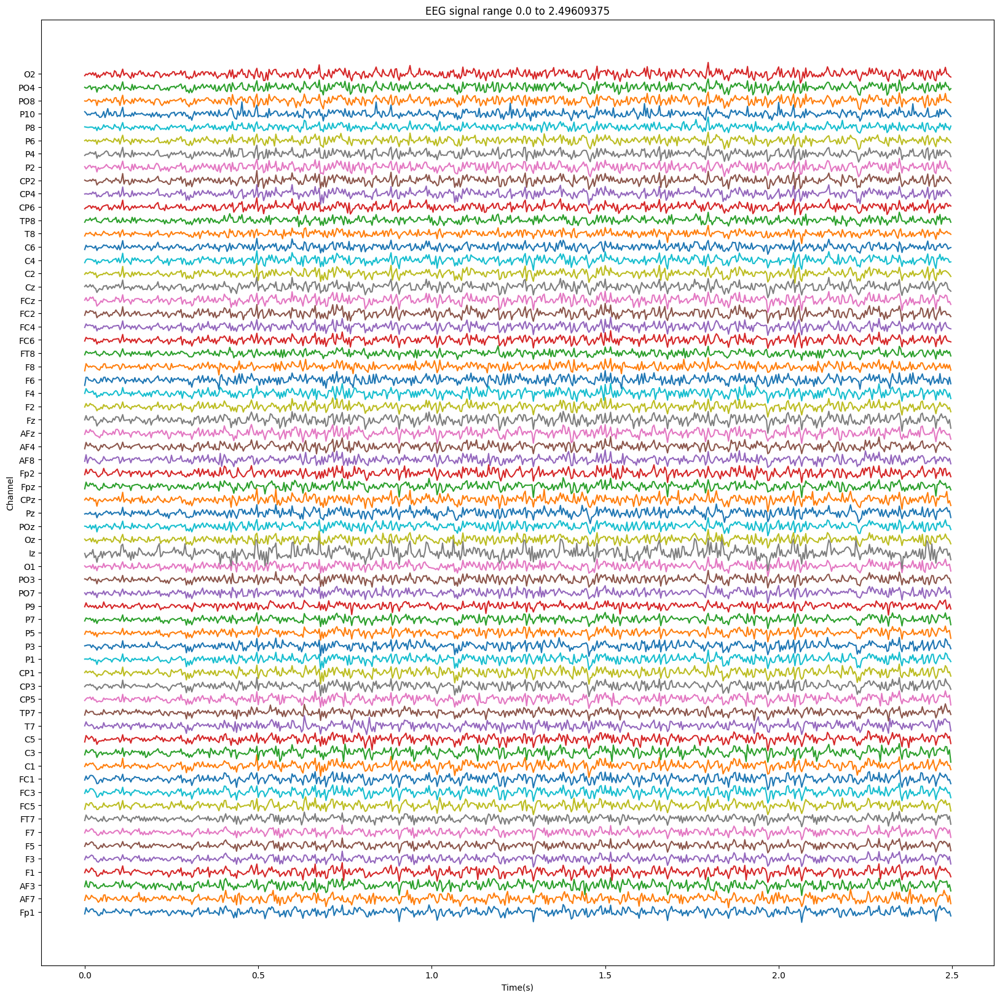

In [23]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot all channels signals from 3 segment 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# remove trend mean of each segment : 
mean_removed_signal = remove_mean(eeg_signal)

plt.figure(figsize=(20 , 20))
plot_subplot_channels(mean_removed_signal[:,0,:], seg_time_list, channel_labels)


<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
plot spectrum for all channels : 
</h1>

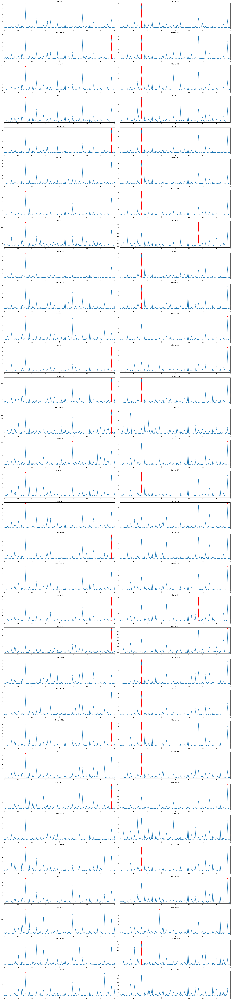

In [24]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot spectrum for all channels :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

plot_spectrum(eeg_signal, 0)


<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
time / frequency analysis
</h1>

[47]
(1, 99, 640)
(99, 640)
(640,)
(99,)


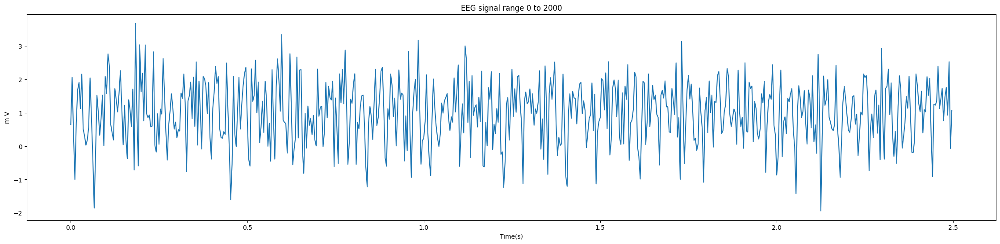

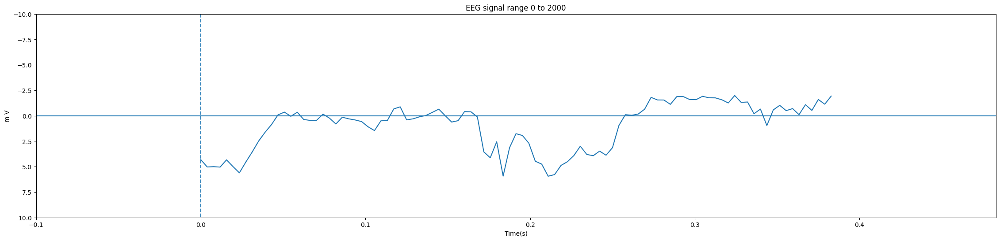

In [27]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# calculate mean of all segment of selected channel : 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# extract selected channel : 
channel = ["Cz"]

selected_ch_inx = select_channel(channel_labels, channel)
print(selected_ch_inx)

# extract selected channel :
selected_ch_signals = extract_selected_channels(eeg_signal, selected_ch_inx)
print(np.shape(selected_ch_signals))
selected_ch_signals = selected_ch_signals.reshape(np.shape(selected_ch_signals)[1], np.shape(selected_ch_signals)[2])

print(np.shape(selected_ch_signals))

# calculate mean of all segment of selected channel : 
mean_signal = calc_signal_mean(selected_ch_signals)
mean_segments = calc_segments_mean(selected_ch_signals[:, 0:])

print(np.shape(mean_signal))
print(np.shape(mean_segments))


# plot mean of all segment :
plot_one_signal(mean_signal, 0, 2000, 256.0)

# plot mean of all signal in segment
plot_erp_signal(mean_segments, 0, 2000, 256.0)


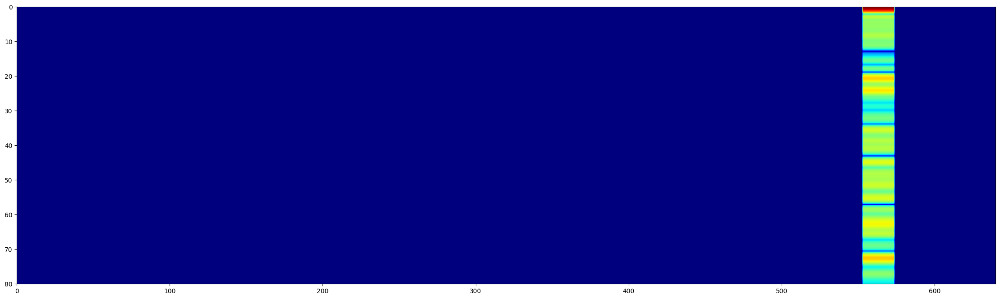

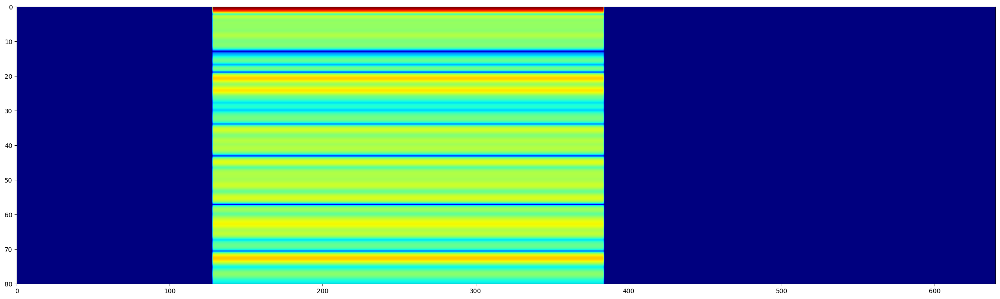

In [28]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# frequency / time analysis for mean of selected channel :
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# parameter :
timewin_ms_example = 500
stime_example = 500
# plot frequency / time for one point of time
time_point_frequency_analysis(
    mean_signal, timewin_ms_example, stime_example, EEGsrate=256.0
)

# parameter :
timewin_ms_example = 500
start_time = 0.5
end_time = 1.5

# plot frequency / time for range of time
time_range_frequency_analysis(
    mean_signal, timewin_ms_example, start_time, end_time, EEGsrate=256.0
)

(640,)
Overlap of 98.66666666666667%


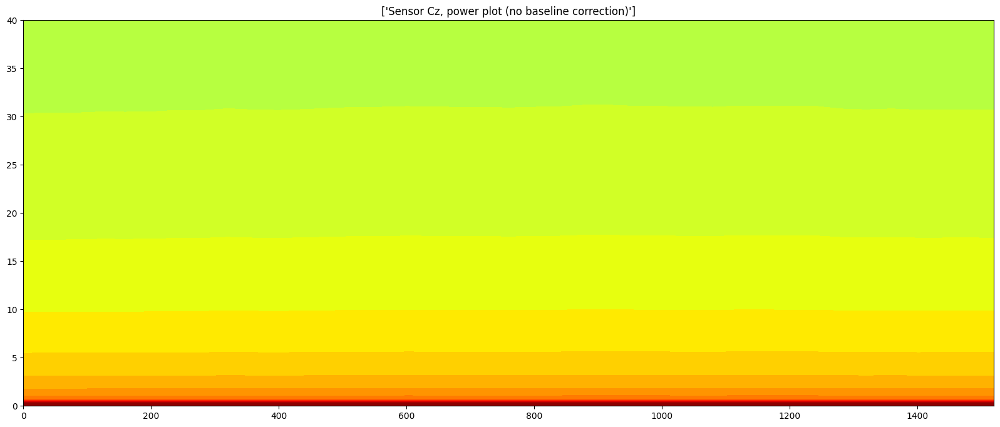

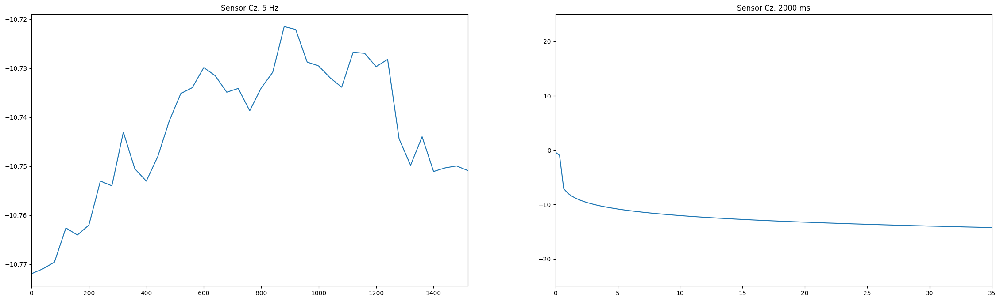

In [29]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot time / frequency analysis plots 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

print(np.shape(mean_signal))

EEGtimes = np.arange(0, np.shape(mean_signal)[0]) / sampling_freq       # create time_matrix
EEGtimes = np.linspace(np.min(EEGtimes), np.max(EEGtimes) * 1000, 1000) # convert from sec to ms
timewin = 3000                                                           # in ms, for stFFT
times2save = np.arange(0,1500 + 50,40)                               # in ms
channel2plot = channel[0]
frequency2plot = 5                                                     # in Hz
timepoint2plot = 2000                                                     # ms
EEGsrate = sampling_freq
EEGdata = mean_signal


time_freq_analysis(EEGdata, EEGtimes, EEGsrate, timewin, times2save, channel2plot, frequency2plot, timepoint2plot)


<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
extract 10 trial from each brain side
</h1>

In [30]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# extract 10 segment for 4 channel (Central, Parietal, Frontal, Occipital)
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# select channels :
selected_channels = ["Fz", "Cz", "Oz", "T8", "T7"]

selected_ch_inx = select_channel(channel_labels, selected_channels)
print(selected_ch_inx)

# extract selected channel :
selected_ch_signals = extract_selected_channels(eeg_signal, selected_ch_inx)
print(np.shape(selected_ch_signals))

# calculate mean of segment
mean_signal_selected_ch = []
for channel in range(np.shape(selected_ch_signals)[0]):
    mean_signal_selected_ch.append(calc_segments_mean(selected_ch_signals[channel,:,:]))

print(np.shape(mean_signal_selected_ch))

[37, 47, 28, 51, 14]
(5, 99, 640)
(5, 99)



<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
butter plot
</h1>

In [31]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# filter signal for 4 range of frequency
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# frequency range
signal_2d = np.array(mean_signal_selected_ch)
lowcuts = [0.5, 10, 5]
highcuts = [40, 15, 15]
num_signal_each_plot = 4
eeg_data_filtered = np.empty(
    (num_signal_each_plot, np.shape(signal_2d)[0], np.shape(signal_2d)[1])
)
eeg_data_filtered[0, :, :] = signal_2d[:, :]

# use filter function : 
for it in range(1, num_signal_each_plot):
    for channel in range(np.shape(signal_2d)[0]):
        eeg_data_filtered[it, channel, :] = butter_bandpass_filter_with_transition_width(
            signal_2d[channel, :], lowcuts[(it-1)], highcuts[(it-1)], fs=256, transition_width=0.15,order=4 
        )
print(np.shape(eeg_data_filtered))

(4, 5, 99)


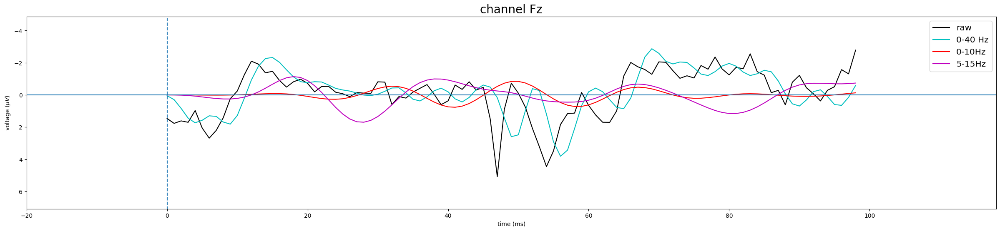

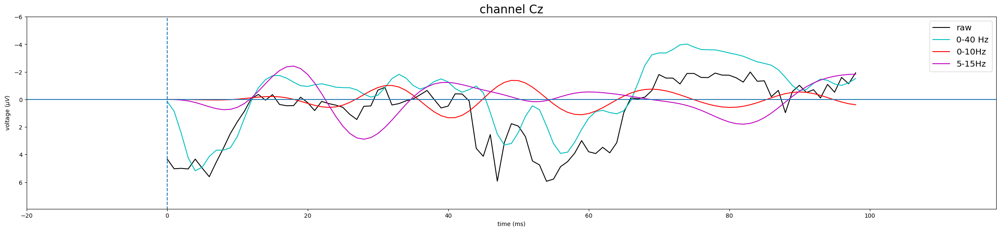

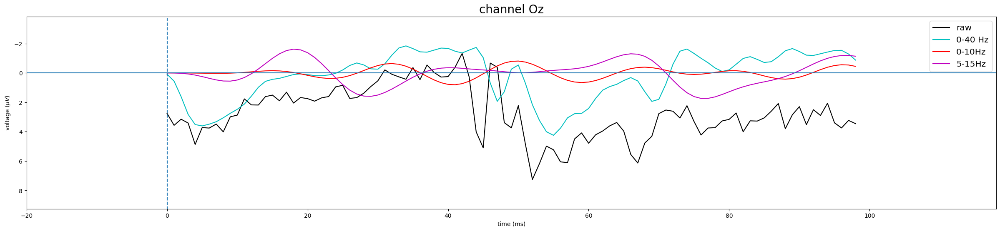

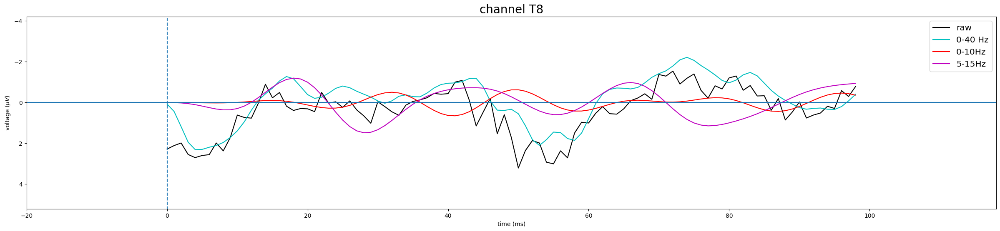

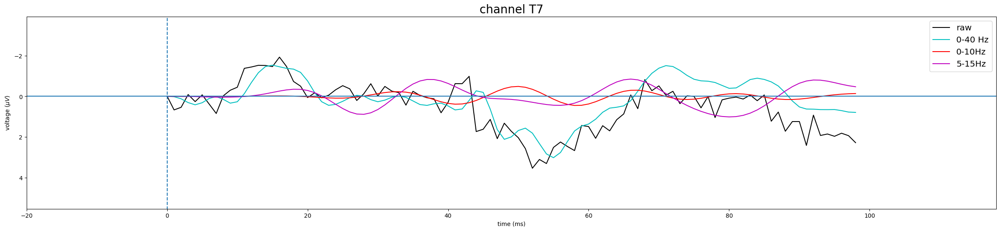

In [32]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot un-filtered signal and filtered signals of all channel on each other 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

combined_time_list = np.arange(0, np.shape(eeg_data_filtered)[2])

for channel in range(np.shape(eeg_data_filtered)[1]):
        plt.figure(figsize=(30, 6))
        plt.plot(combined_time_list,eeg_data_filtered[0,channel, :2000],'k')
        plt.plot(combined_time_list,eeg_data_filtered[1,channel, :2000],'c')
        plt.plot(combined_time_list,eeg_data_filtered[2,channel, :2000],'r')
        plt.plot(combined_time_list,eeg_data_filtered[3,channel, :2000],'m')
        
        plt.vlines(0,-10,10,linestyles='dashed')
        plt.hlines(0,-1000,1500)
        _ = plt.setp(plt.gca(), 'xlim', [combined_time_list[0] - 20, combined_time_list[-1] + 20])
        _ = plt.setp(plt.gca(), 'ylim', [np.min(eeg_data_filtered[:,channel, :]) - 2, np.max(eeg_data_filtered[:,channel, :] + 2)])
        plt.gca().invert_yaxis() #EEG convention to flip y axis        
        plt.xlabel("time (ms)")
        plt.ylabel("voltage " + r"$(\mu V)$")
        plt.title(f'channel {channel_labels[selected_ch_inx[channel]]}', fontsize=20)
        _=plt.legend(['raw','0-40 Hz','0-10Hz','5-15Hz'], fontsize="x-large")
        plt.show()


(64, 99)


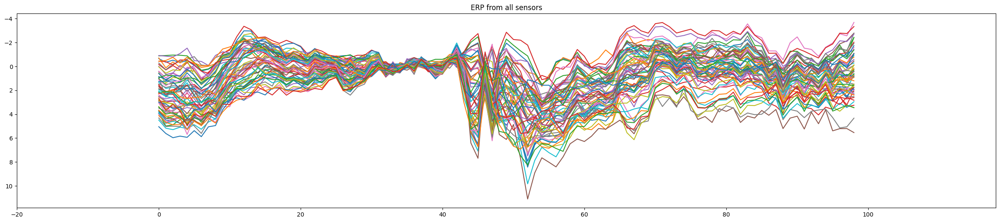

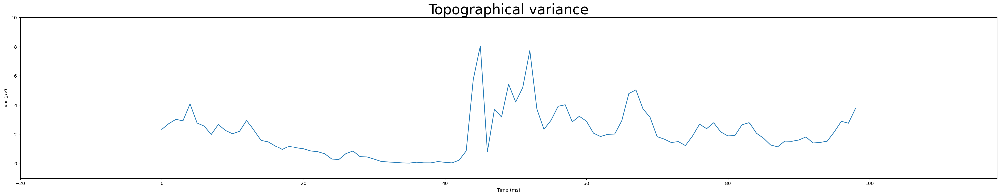

In [34]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot mean of segments from all channels : 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# create time index
eeg_times = np.arange(0, 99)

# calculate mean of segment
mean_signal_all_ch = []
for channel in range(np.shape(eeg_signal)[0]):
    mean_signal_all_ch.append(calc_segments_mean(eeg_signal[channel,:,:]))

print(np.shape(mean_signal_all_ch))
mean_signal_all_ch = np.array(mean_signal_all_ch)
plt.figure(figsize=(30, 6))
plt.plot(eeg_times,np.squeeze(mean_signal_all_ch.T))
plt.gca().invert_yaxis() #flip for EEG conventions
plt.title("ERP from all sensors")
_ = plt.setp(plt.gca(), 'xlim', [eeg_times[0] - 20, eeg_times[-1] + 20])
plt.show()

# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
#topographical variance plot 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████


plt.figure(figsize=(30, 6))
plt.plot(eeg_times,np.squeeze(mean_signal_all_ch.var(axis=0)))
plt.xlabel("Time (ms)")
plt.ylabel("var "+r'$ (\mu V) $')
plt.title("Topographical variance", fontsize = 30)
plt.tight_layout()
_ = plt.setp(plt.gca(), 'xlim', [eeg_times[0] - 20, eeg_times[-1] + 20])
_ = plt.setp(plt.gca(), 'ylim', [-1, 10])

plt.show()


<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
Topographic Analysis
</h1>

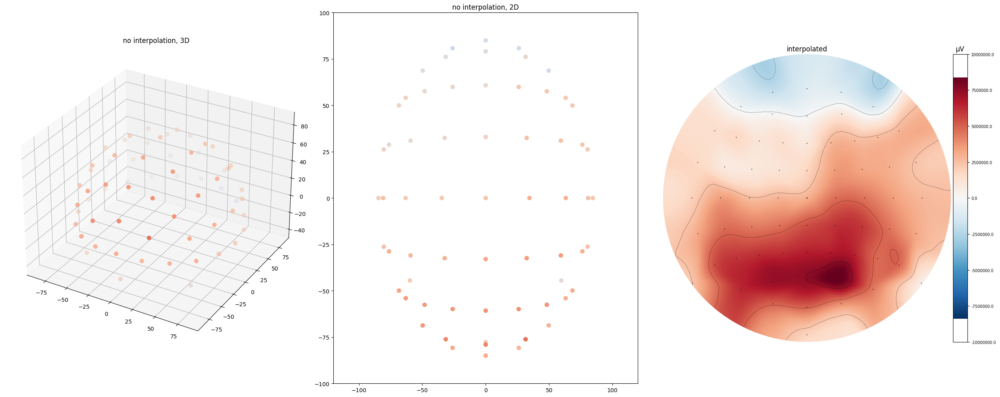

In [35]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot topographic plot with MNE library 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
 
TOI = 300       # ms
evoked_object = create_mne_evoked_object(eeg_data, channel_labels)

plot_topomap_interpolated(evoked_object, TOI, eeg_data)

<Figure size 2800x1500 with 0 Axes>

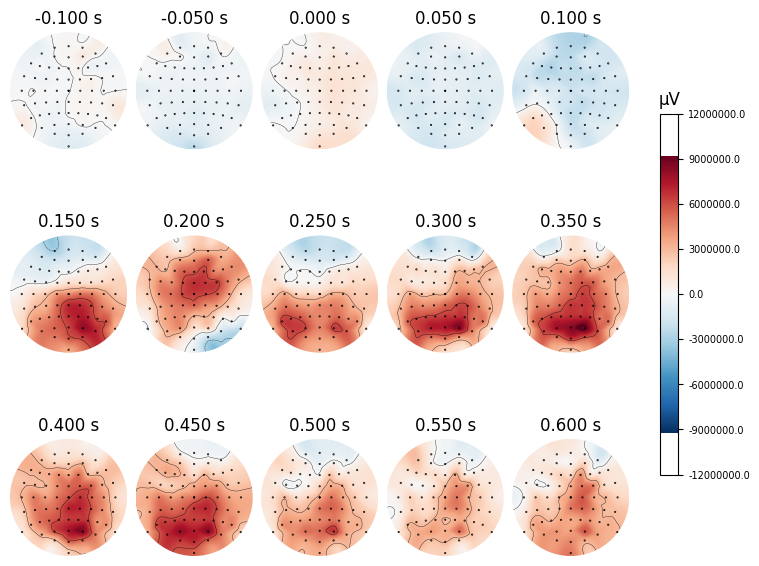

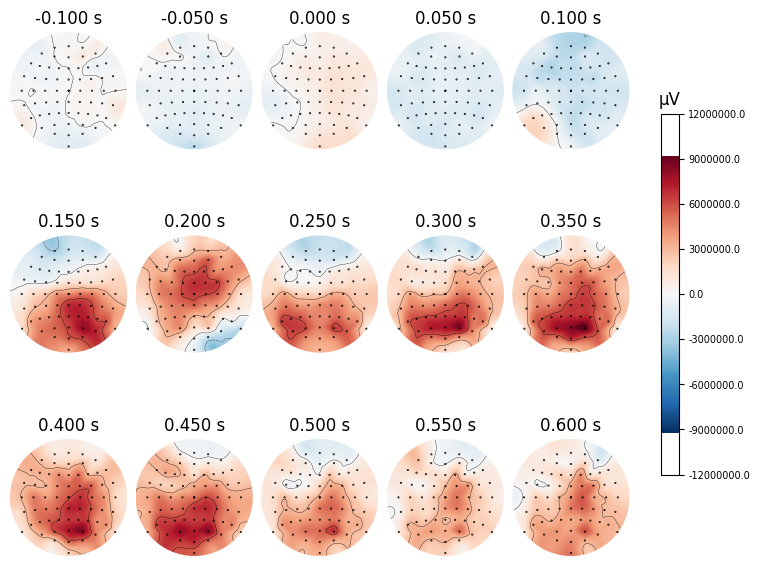

In [36]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# # plot topomap, interpolated surface, 50 ms intervals
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

plt.figure(figsize=(28, 15))
evoked_object.plot_topomap(times=np.linspace(-100,600,15)/1000, nrows=3)

/tmp/ipykernel_34605/113467047.py:756: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  rts[ei] = eventlatency[time0event + 1]


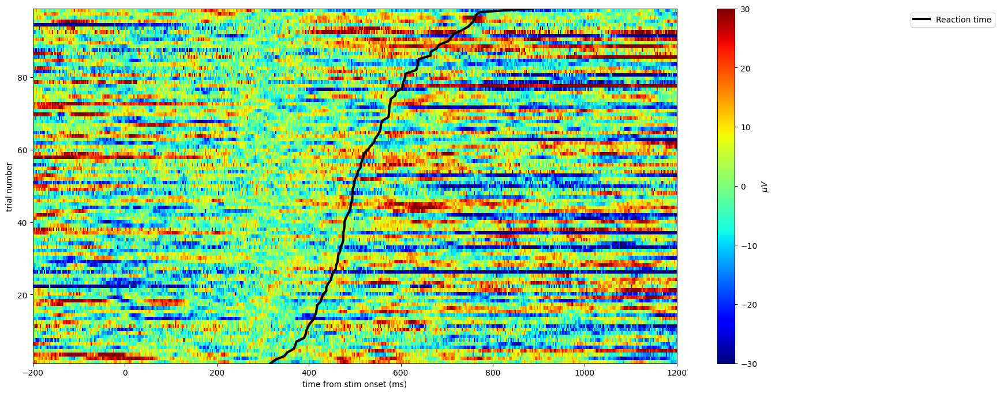

In [37]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot Reaction Time plot 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

eeg_time = np.arange(-200,1200,1)
eeg_trials = 99
eeg_signal_origin = eeg_signal.reshape(64, 640, 99)

plot_sorted_trials(eeg_signal_origin ,EEG_epoch, eeg_time, eeg_trials)

<h1 style="margin:20px auto 20px auto; width:95%; text-align:center; color:rgba(245, 245, 245, 1.0); height:85px; font-size:35px; font-weight:bold; test-justify:center;background-color: rgb(69, 69, 69);border-radius:2px ;padding-top:20px; border:2px solid black;box-shadow: 2px 8px 10px rgba(0, 0, 0, 0.600);text-shadow: 1px 1px 2px rgba(200, 200, 200, 0.9);">
Entropy Analysis
</h1>

In [38]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# Entropy Analysis for Topographic MNE 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# parameter initialization : 
n_bins = 25
n_channels = 64

# define time windows of interest
t_task = [100, 400]
t_base = [-400, -100]

# define coords for topographic map 
x_axis = eeg_data["EEG"][0, 0]['chanlocs'][0]['X'][0:64]
y_axis = eeg_data["EEG"][0, 0]['chanlocs'][0]['Y'][0:64]
z_axis = eeg_data["EEG"][0, 0]['chanlocs'][0]['Z'][0:64]

x_locs = np.empty(64)
y_locs = np.empty(64)
z_locs = np.empty(64)

for it in range(0, 64) :
    x_locs[it] = (x_axis[it][0][0])
    y_locs[it] = (y_axis[it][0][0])
    z_locs[it] = (z_axis[it][0][0])

coords_2d = np.column_stack([y_locs, x_locs])

# initialize variable for topographic map 
entropy_topo = np.zeros(n_channels)
idx_task = np.zeros(len(t_task))
idx_base = np.zeros(len(t_task))

# align time-windows of interest to time vector of EEG data
for ii in range(len(t_task)):
    idx_task[ii] = np.argmin(np.abs(EEG_times - t_task[ii]))
    idx_base[ii] = np.argmin(np.abs(EEG_times - t_base[ii]))

# loop through channels and compute entropy for task and baseline
for i_chan in range(n_channels):
    
    # calc entropy during time window of interest
    eeg_chan = eeg_signal_origin[i_chan, int(idx_task[0]):int(idx_task[1])]
    hist = np.histogram(eeg_chan, n_bins)
    prob = hist[0] / np.sum(hist[0])
    entropy_task = -np.sum(prob * np.log2(prob+1E-6))

    # calc entropy during baseline
    eeg_chan = eeg_signal_origin[i_chan, int(idx_base[0]):int(idx_base[1])]
    hist = np.histogram(eeg_chan, n_bins)
    prob = hist[0] / np.sum(hist[0])
    entropy_base = -np.sum(prob * np.log2(prob+1E-6))

    # compute entropy (normalized to baseline)
    entropy_topo[i_chan] = entropy_task - entropy_base



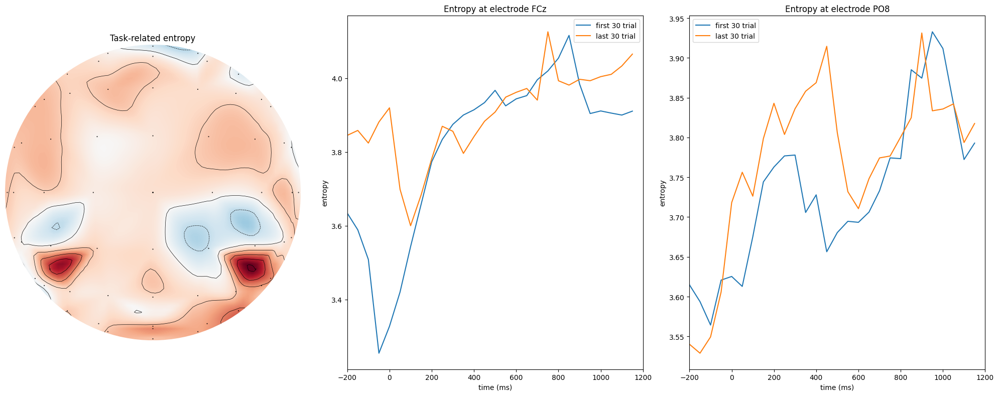

In [39]:
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████
# plot topographic Entropy and selected channels Entropy 
# ██████████████████████████████████████████████████████████████████████████████████████████████████████████████

# compute entropy with sliding widow
channel_1_entropy, time_topo = calc_sliding_entropy(eeg_signal_origin, EEG_times, ['FCz'], channel_labels)
channel_2_entropy, _ = calc_sliding_entropy(eeg_signal_origin, EEG_times, ['PO8'], channel_labels)

# plot 
plot_topo_channel_Entropy(entropy_topo, coords_2d, time_topo, channel_1_entropy, channel_2_entropy)